# 🚴 Seoul Bike Ride Demand Forecasting

Welcome to this notebook on **Seoul Bike Ride Demand Forecasting**! In this analysis, we will explore the factors influencing bike ride demand with data from 2017 and 2018 in Seoul, South Korea.

## Key Objectives:
- Analyze historical bike ride data.
- Identify demand patterns based on various features.
- Create a model to oredict bike ride demand across temporal, seasonal, and weather variables.

## 📚 Contents:
1. [Data Overview](#data-overview)
2. [Data Preprocessing](#data-preprocessing)
3. [Data Exploration](#data-exploration)
4. [Data Modelling](#data-modelling)
5. [Results and Insights](#results-and-insights)

Let's get started!


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/SeoulBikeData.csv', encoding='ISO-8859-1')
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


| Feature Name         | Description                                                  | Data Type   |
|----------------------|--------------------------------------------------------------|-------------|
| `Date`            | Date and timestamp of when the ride occurred                        | Categoric      |
| `Rented Bike Count`         | Count of bikes rented at each hour                          | Numeric    |
| `Hour`           | Hour of the day (0 to 23) when the ride occurred                            | Categoric    |
| `Temperature(°C)`           | Temperature in Celsius during the ride                             | Numeric     |
| `Humidity(%)`      | Humidity percentage during the ride                  | Numeric      |
| `Wind speed (m/s)`        | Wind speed in meters per second during the ride                    | Numeric      |
| `Visibility (10m)`          | Visibility measured in meters (the distance at which objects can be clearly seen)                 | Numeric |
| `Dew point temperature(°C)`            | Dew point temperature in Celsius during the ride         | Numeric      |
| `Solar Radiation (MJ/m2)`        | Solar radiation measured in megajoules per square meter during the ride                   | Numeric     |
| `Rainfall(mm)`      | Precipitation in millimeters during the ride                     | Numeric     |
| `Snowfall (cm)`            | Snow accumulation measured in centimeters during the ride         | Numeric      |
| `Seasons`        | Season during which the ride occurred (e.g., Winter, Spring)                   | Categoric     |
| `Holiday`      | Indicates whether the day was a holiday                    | Categoric     |
| `Functioning Day`      | Day when the bike-sharing system is operational                     | Categoric     |

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [5]:
df.shape

(8760, 14)

In [6]:
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [7]:
df.dtypes

,0
Date,object
Rented Bike Count,int64
Hour,int64
Temperature(°C),float64
Humidity(%),int64
Wind speed (m/s),float64
Visibility (10m),int64
Dew point temperature(°C),float64
Solar Radiation (MJ/m2),float64
Rainfall(mm),float64


In [8]:
# Count of categorical variables (Holiday, Functioning Day, Seasons)
holiday_counts = df['Holiday'].value_counts()
functioning_day_counts = df['Functioning Day'].value_counts()
season_counts = df['Seasons'].value_counts()

print("\nHoliday Distribution:")
print(holiday_counts)

print("\nFunctioning Day Distribution:")
print(functioning_day_counts)

print("\nSeasons Distribution:")
print(season_counts)


Holiday Distribution:
Holiday
No Holiday    8328
Holiday        432
Name: count, dtype: int64

Functioning Day Distribution:
Functioning Day
Yes    8465
No      295
Name: count, dtype: int64

Seasons Distribution:
Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: count, dtype: int64


In [9]:
# Rented Bike Count Statistics
average_rented_bikes = df['Rented Bike Count'].mean()
total_rides = df['Rented Bike Count'].sum()
max_rented_bikes = df['Rented Bike Count'].max()
min_rented_bikes = df['Rented Bike Count'].min()

print(f"\nAverage Rented Bikes: {average_rented_bikes:.2f}")
print(f"Total Rented Bikes: {total_rides}")
print(f"Max Rented Bikes: {max_rented_bikes}")
print(f"Min Rented Bikes: {min_rented_bikes}")


Average Rented Bikes: 704.60
Total Rented Bikes: 6172314
Max Rented Bikes: 3556
Min Rented Bikes: 0


# 🛠️ Data Preprocessing

In this section, we will prepare the bike ride data for analysis and modeling. Data preprocessing is a crucial step that involves cleaning and transforming the dataset to ensure its quality and usability.

## Key Objectives:
- **Handle Missing and Duplicate Values**: Identify and manage any missing or duplicate data points in the dataset.
- **Data Type Conversion**: Convert data types to appropriate formats for analysis.
- **Data Splitting**: Split data where needed to enhance further handling of the data.
- **Data Profiling**: Get a comprehensive report on the data.
- **Outlier Detection**: Identify outliers that may skew the analysis.

In [11]:
df.duplicated().sum()

0

In [12]:
df.isna().sum()

,0
Date,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0


In [13]:
# Converting data types
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.dtypes

,0
Date,datetime64[ns]
Rented Bike Count,int64
Hour,int64
Temperature(°C),float64
Humidity(%),int64
Wind speed (m/s),float64
Visibility (10m),int64
Dew point temperature(°C),float64
Solar Radiation (MJ/m2),float64
Rainfall(mm),float64


In [14]:
# Splitting the Date  to Day - Month - Year Columns
df['day_of_week'] = df['Date'].dt.day_name() # Day
df["month"] = df['Date'].dt.month_name()   # Month
df["year"] = df['Date'].map(lambda x: x.year).astype("object")     # Year, and convert it to  object type (to treat it as a categorical variable and avoid unintended arithmetic operations)

In [15]:
# Outliers Detection

def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Create a boolean mask for outliers
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Detect outliers for 'Rented Bike Count'
outliers_rented_bike_count = detect_outliers_iqr(df, 'Rented Bike Count')
print("Outliers in Rented Bike Count:")
print(outliers_rented_bike_count)

Outliers in Rented Bike Count:
           Date  Rented Bike Count  Hour  Temperature(°C)  Humidity(%)  \
2946 2018-04-02               2401    18             20.7           54   
2994 2018-04-04               2402    18             16.0           47   
3114 2018-04-09               2401    18             14.8           24   
3210 2018-04-13               2404    18             17.5           18   
3282 2018-04-16               2692    18             17.0           28   
...         ...                ...   ...              ...          ...   
7746 2018-10-19               2631    18             16.6           40   
7818 2018-10-22               2613    18             17.3           43   
7842 2018-10-23               2415    18             14.5           71   
7866 2018-10-24               2612    18             15.1           53   
7890 2018-10-25               2632    18             17.3           39   

      Wind speed (m/s)  Visibility (10m)  Dew point temperature(°C)  \
2946     

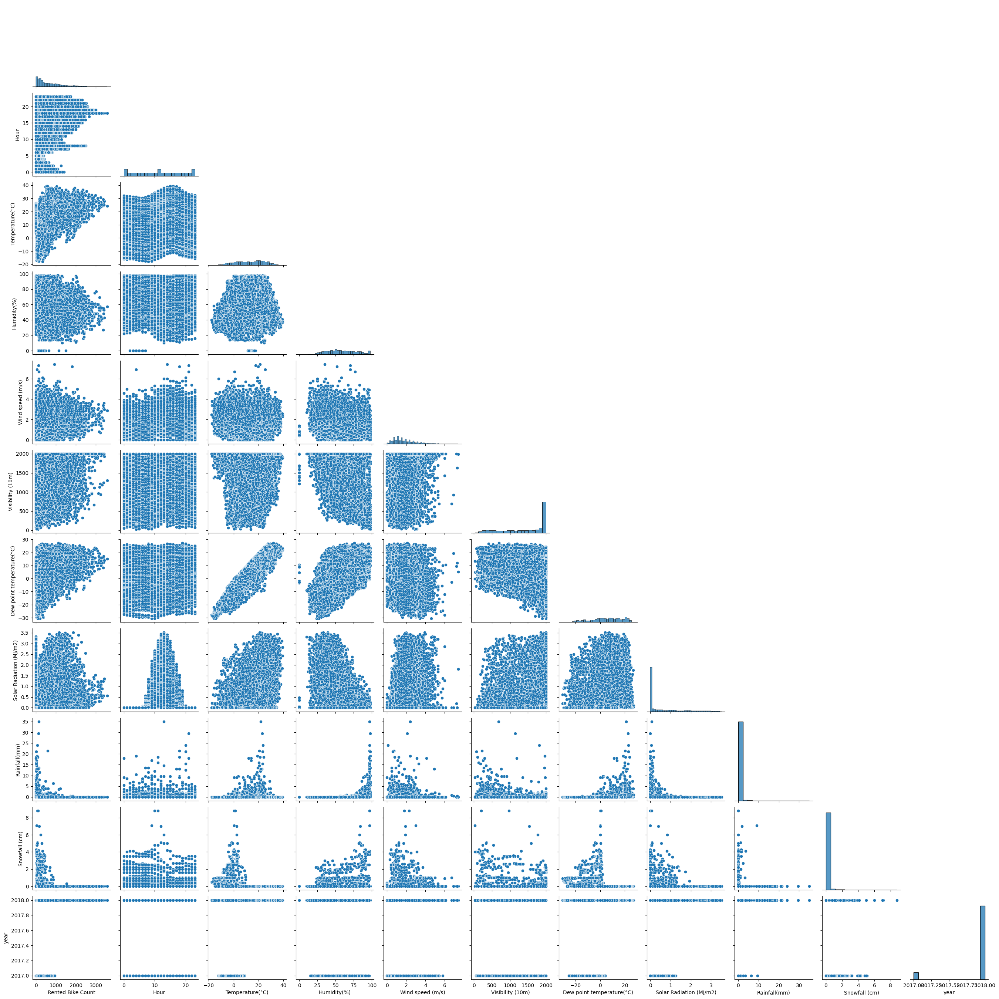

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.pairplot(df, corner=True)

In [17]:
# Categorical Column Value Count
categorical_features=df.select_dtypes(include='object')

for i in categorical_features.columns:
  print("\n ")
  print('column name  : ', i)
  print(df[i].value_counts())


 
column name  :  Seasons
Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: count, dtype: int64

 
column name  :  Holiday
Holiday
No Holiday    8328
Holiday        432
Name: count, dtype: int64

 
column name  :  Functioning Day
Functioning Day
Yes    8465
No      295
Name: count, dtype: int64

 
column name  :  day_of_week
day_of_week
Friday       1272
Saturday     1248
Sunday       1248
Monday       1248
Tuesday      1248
Wednesday    1248
Thursday     1248
Name: count, dtype: int64

 
column name  :  month
month
December     744
January      744
March        744
May          744
July         744
August       744
October      744
April        720
June         720
September    720
November     720
February     672
Name: count, dtype: int64

 
column name  :  year
year
2018    8016
2017     744
Name: count, dtype: int64


In [18]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.0/390.0 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 70.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=7f2324415902aa8c3718a81dadd415578d1e7bd6880fb728f3cf9ba13292fde4
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [19]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

profile.to_file("profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

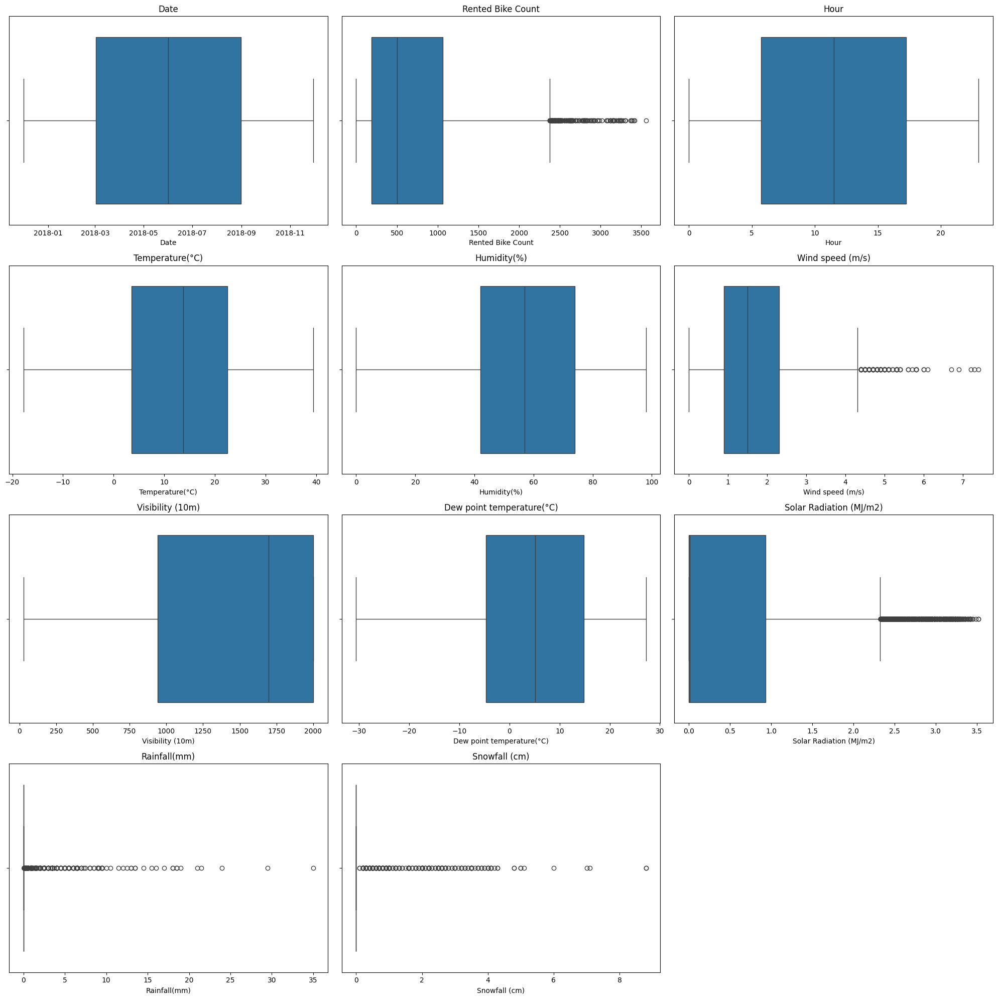

In [20]:
numeric_features = df.select_dtypes(exclude='object')

num_features = len(numeric_features.columns)

ncols = 3
nrows = (num_features + ncols - 1) // ncols

plt.figure(figsize=(20, 5 * nrows))

for n, feature in enumerate(numeric_features.columns, start=1):
    plt.subplot(nrows, ncols, n)
    sns.boxplot(x=df[feature])
    plt.title(feature)

plt.tight_layout()
plt.show()

In [21]:
#No specific outliers to deal with at the moment. Outliers in Rainfall, Snowfall, Solar Radiation and Windspeed variables are logical considering seasonal imapact.
#The outliers in bike ride count represent real demand fluctuations, which is important for our model to know. We will think about if normalising is needed soon.

**Context on Seoul Wather and Holiday Variables per Season from Secondary Data Sources**

Here are some insights to help us in data exploartion.

| Variable                | Spring | Summer | Fall  | Winter |
|-------------------------|--------|--------|-------|--------|
| Temperature (°C)       |  10°C - 20°C    |  25°C and higher      |   25°C - 10°C    |   -5°C - 5°C     |
| Humidity (%)            |    Moderate    |   High (Monsoon Jangma)     |    Moderate to High   |     Low   |
| Wind Speed (m/s)       |    Moderate    | Low to Moderate       |  Moderate     |  Moderate      |
| Visibility (10m)        | OK (yellow dust in early spring)       |   Poor (Monsoon Jangma)     |  Good     |  Good      |
| Dew Point Temperature (°C)|  Moderate     |  High      | Moderate to Low      |  Low      |
| Solar Radiation (MJ/m²) |   Moderate to High     |   High     |   High to Moderate    |   Low     |
| Rainfall (mm)          |  Moderate      |   High (Monsoon Jangma)     |   Low to Moderate    |   Low     |
| Snowfall (cm)          |    None    |   None     |  None     |  Moderate      |
| Holiday                |    3 holidays    |   2 holidays     |  3 holidays     |  3 holidays      |

# 🔍 Data Exploration

In this section, we will explore the bike ride dataset to understand the relationships between various features and the demand for bike rides. Data exploration helps in identifying patterns, trends, and anomalies in the data, which are crucial for building an effective predictive model.

## 🛠️ Steps Involved:
**Data Distribution**:
1. Distribution Analysis: Visualize variable distributions effectively.
2. Demand by Category: Assess impact of categories on demand.
3. Hourly Variation: Explore demand across different hours.

**Temporal Analysis**:
1. Demand Trends: Examine patterns over time.
2. Demand Comparison: Analyze variations between weekdays and weekends.
3. Seasonal Representation: Check data adequacy for bias avoidance.

**Influencing Factors**:
1. Weather Influence: Analyze demand correlation with weather variables.
2. Multi-Variable Analysis: Investigate interactions between influencing factors.
3. Preprocessing Needs: Determine scaling or transformation requirements.

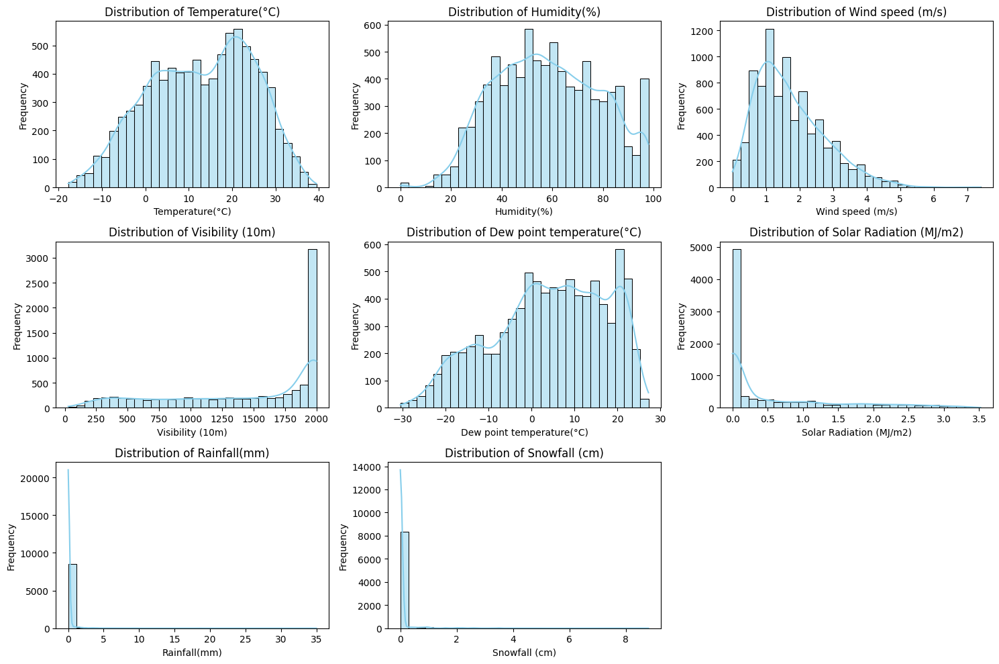

In [22]:
#What does data distribution of each variable look like?

continuous_vars = ['Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
                   'Visibility (10m)', 'Dew point temperature(°C)',
                   'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

# Plotting in a 3xN grid
fig, axes = plt.subplots(nrows=len(continuous_vars)//3 + 1, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, var in enumerate(continuous_vars):
    sns.histplot(df[var], bins=30, kde=True, color='skyblue', edgecolor='black', ax=axes[i])
    axes[i].set_title(f'Distribution of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')

# Removing empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [23]:
# Someting to note: We notice that some of our columns are left (Wind speed (m/s), Solar Radiation (MJ/m2), Rainfall(mm), Snowfall (cm)) and some are right skewed (Visibility (10m)).

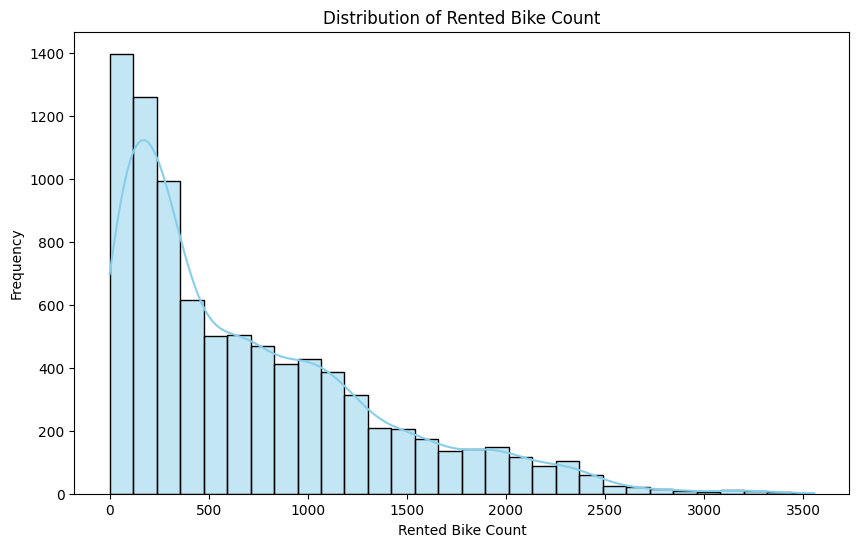

In [24]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Rented Bike Count'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Rented Bike Count')
plt.xlabel('Rented Bike Count')
plt.ylabel('Frequency')
plt.show()

In [25]:
#Our main variable, the dependent variable, is left skewed, too. We will need to normalize it.

<ipython-input-26-0e68d513423c>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, palette='Set2', ax=axes[i], order=df[var].value_counts().index)
<ipython-input-26-0e68d513423c>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, palette='Set2', ax=axes[i], order=df[var].value_counts().index)
<ipython-input-26-0e68d513423c>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=var, palette='Set2', ax=axes[i], order=df[var].value_counts().index)
<ipython-input-26-0e68d513423c>:8: FutureWarning: 

Passin

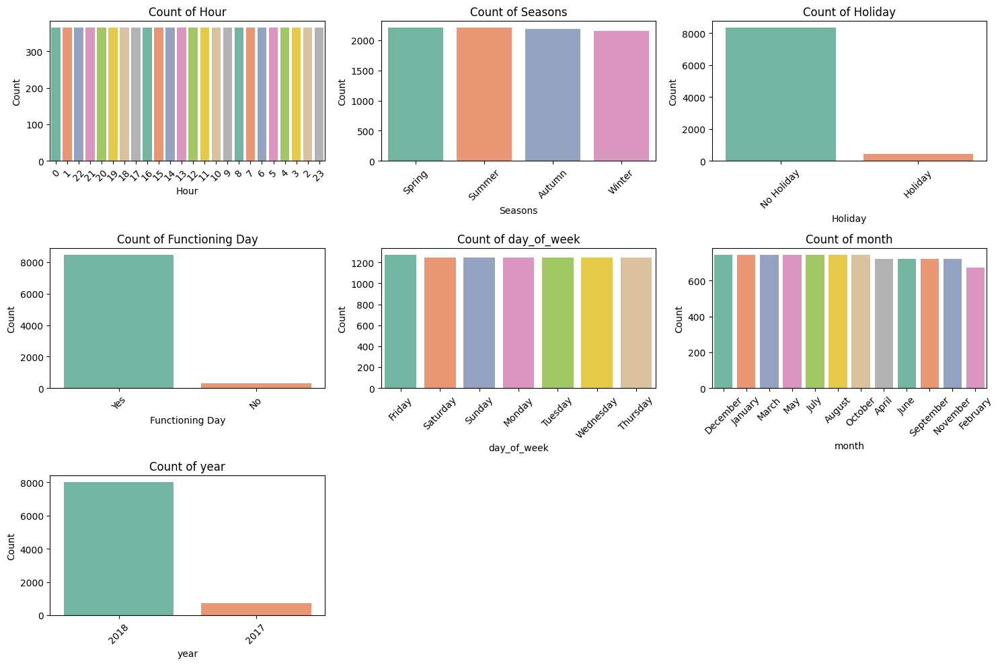

In [26]:
categorical_vars = ['Hour', 'Seasons', 'Holiday', 'Functioning Day', 'day_of_week', 'month', 'year']

# Plotting in a 3xN grid
fig, axes = plt.subplots(nrows=len(categorical_vars)//3 + 1, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, var in enumerate(categorical_vars):
    sns.countplot(data=df, x=var, palette='Set2', ax=axes[i], order=df[var].value_counts().index)
    axes[i].set_title(f'Count of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=45)

# Removing empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

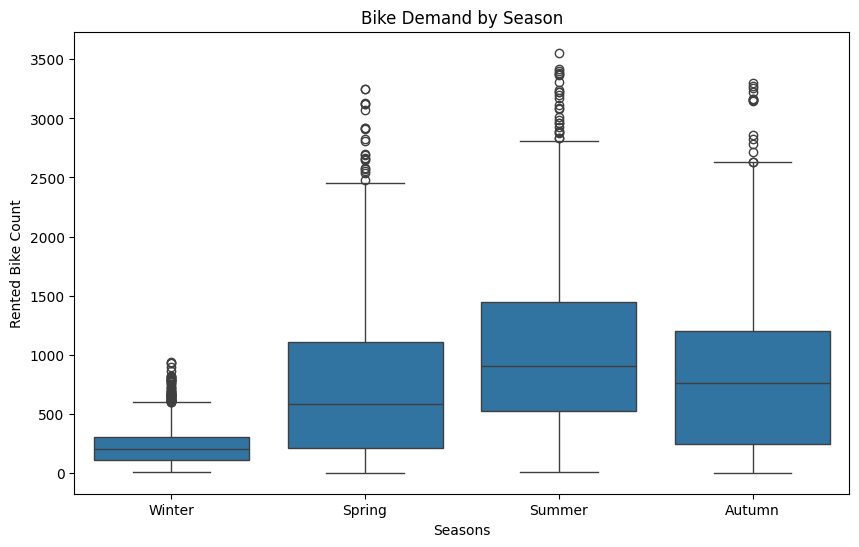

In [27]:
#Influence of Categorical Values on the Demand

# 1. Seasons
plt.figure(figsize=(10, 6))
sns.boxplot(x='Seasons', y='Rented Bike Count', data=df)
plt.title('Bike Demand by Season')
plt.show()

<ipython-input-28-db2955455f59>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Holiday', y='Rented Bike Count', data=df, ci=None)


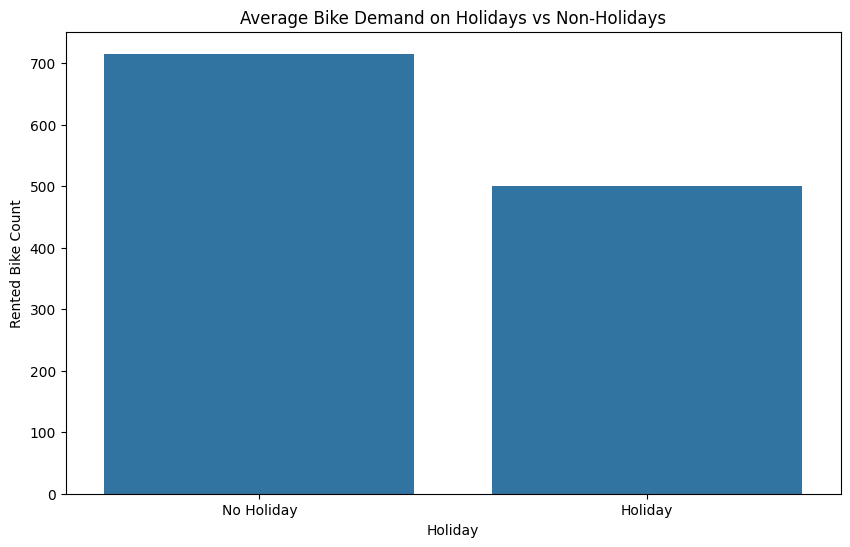

In [28]:
# 2. Holiday
plt.figure(figsize=(10, 6))
sns.barplot(x='Holiday', y='Rented Bike Count', data=df, ci=None)
plt.title('Average Bike Demand on Holidays vs Non-Holidays')
plt.show()

<ipython-input-29-bfb0219f114a>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Functioning Day', y='Rented Bike Count', data=df, ci=None)


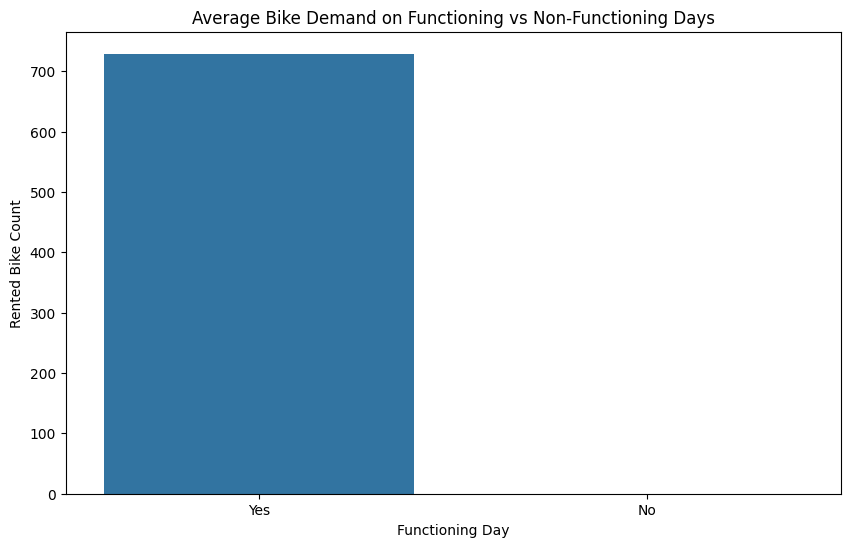

In [29]:
# 3. Functioning Day
plt.figure(figsize=(10, 6))
sns.barplot(x='Functioning Day', y='Rented Bike Count', data=df, ci=None)
plt.title('Average Bike Demand on Functioning vs Non-Functioning Days')
plt.show()

In [30]:
# Filter rows where 'Functioning Day' is 'No'
non_functioning_days = df[df['Functioning Day'] == 'No']

# Display the filtered rows
print("Rows with 'Functioning Day' as 'No':")
print(non_functioning_days)

Rows with 'Functioning Day' as 'No':
           Date  Rented Bike Count  Hour  Temperature(°C)  Humidity(%)  \
3144 2018-04-11                  0     0             14.4           82   
3145 2018-04-11                  0     1             13.6           81   
3146 2018-04-11                  0     2             12.7           80   
3147 2018-04-11                  0     3             11.6           81   
3148 2018-04-11                  0     4             10.2           83   
...         ...                ...   ...              ...          ...   
8251 2018-11-09                  0    19             11.9           71   
8252 2018-11-09                  0    20             11.9           72   
8253 2018-11-09                  0    21             11.4           74   
8254 2018-11-09                  0    22             11.2           75   
8255 2018-11-09                  0    23             10.9           76   

      Wind speed (m/s)  Visibility (10m)  Dew point temperature(°C)  \
314

In [31]:
#If it is not a functioning day then there is no demand.

<ipython-input-32-671c9e5544ab>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='day_of_week', y='Rented Bike Count', data=df, ci=None)


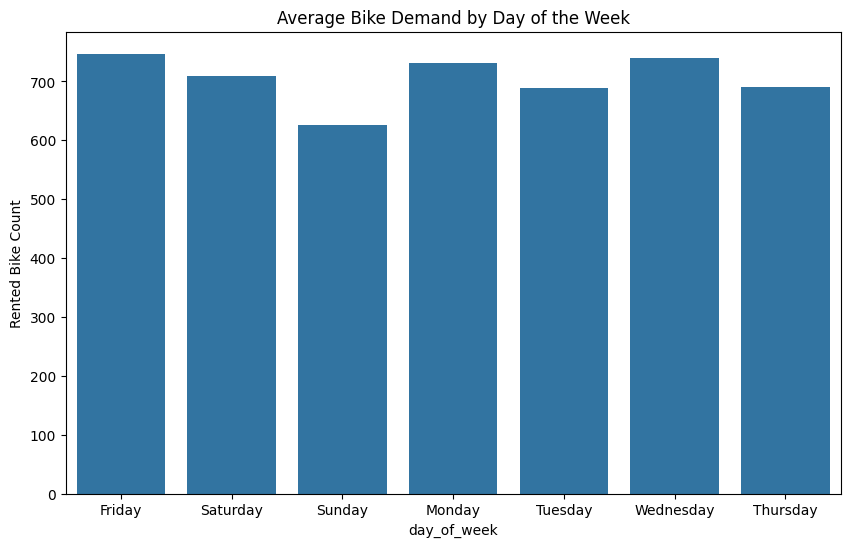

In [32]:
# 4. Day of Week
plt.figure(figsize=(10, 6))
sns.barplot(x='day_of_week', y='Rented Bike Count', data=df, ci=None)
plt.title('Average Bike Demand by Day of the Week')
plt.show()

In [33]:
#Although a trend towards higher demand on weekdays rather than "Sunday" - Please consider many Seoul citizens work Saturdays, too (Workdays are Monday - Friday/Saturday).
# Link: https://joinhorizons.com/countries/south-korea/hiring-employees/working-hours-and-days/#:~:text=What%20are%20the%20standard%20working%20days%20in%20South%20Korea%3F,an%20overtime%20rate%20of%20pay.

<ipython-input-34-6333262e43b0>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='month', y='Rented Bike Count', data=df, ci=None, order=["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"])


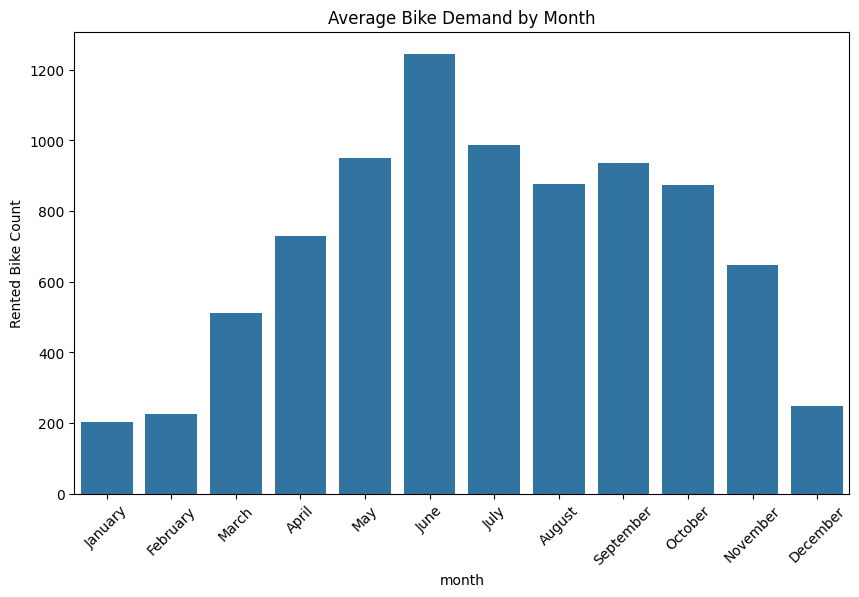

In [34]:
# 5. Month
plt.figure(figsize=(10, 6))
sns.barplot(x='month', y='Rented Bike Count', data=df, ci=None, order=["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"])
plt.title('Average Bike Demand by Month')
plt.xticks(rotation=45)
plt.show()

<ipython-input-35-ad4072dd22a1>:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y='Rented Bike Count', hue='Seasons', data=df, ci=None)


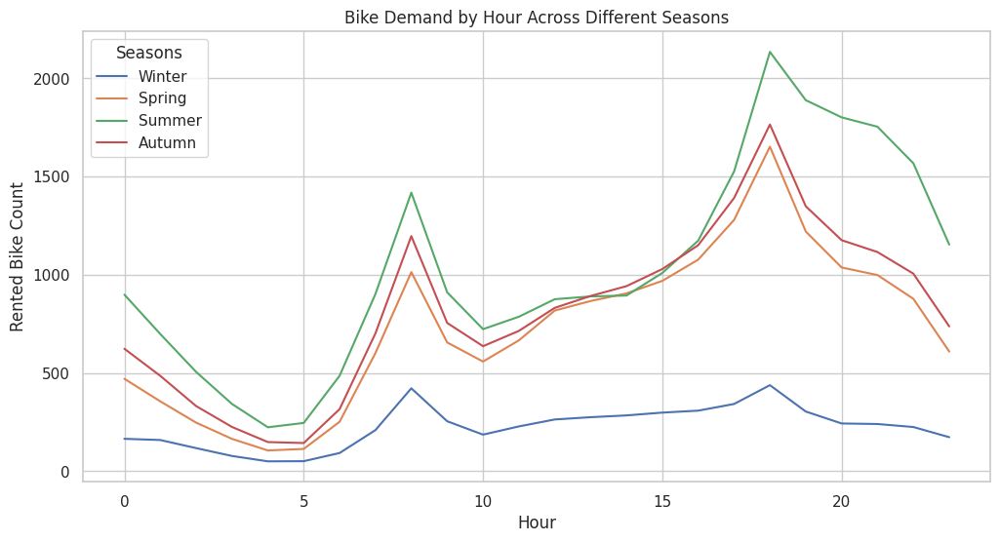

In [35]:
# Trends Over Time Analysis
sns.set(style='whitegrid')

# 1. Bike Demand by Hour across different Seasons
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Rented Bike Count', hue='Seasons', data=df, ci=None)
plt.title('Bike Demand by Hour Across Different Seasons')
plt.ylabel('Rented Bike Count')
plt.show()

In [36]:
#Demand in winter is significantly lower.

<ipython-input-37-0df08815eca8>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y='Rented Bike Count', hue='day_of_week', data=df, ci=None)


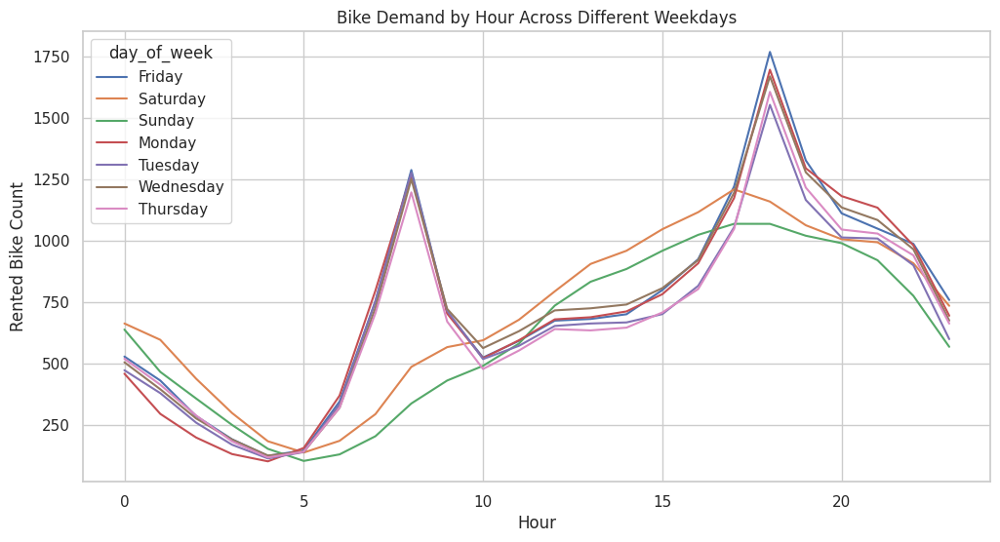

In [37]:
# 2. Bike Demand by Hour across different Weekdays
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Rented Bike Count', hue='day_of_week', data=df, ci=None)
plt.title('Bike Demand by Hour Across Different Weekdays')
plt.ylabel('Rented Bike Count')
plt.show()

In [38]:
#Workdays are consistent in their trend. Saturday and Sunday are visibly differing, peaking from 16:00 to 17:00.

<ipython-input-39-22364c4bb88c>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y='Rented Bike Count', hue='month', data=df, ci=None,


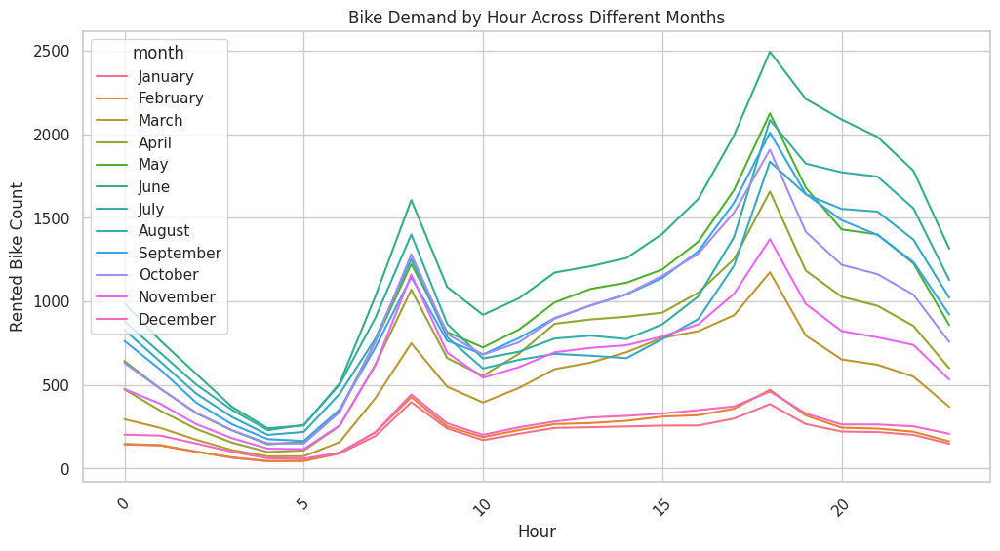

In [39]:
# 3. Bike Demand by Hour across different Months
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Rented Bike Count', hue='month', data=df, ci=None,
             hue_order=["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"])
plt.title('Bike Demand by Hour Across Different Months')
plt.ylabel('Rented Bike Count')
plt.xticks(rotation=45)
plt.show()

In [40]:
#Rush hours are consistently 7:00-9:00 and 17:00-19:00.

<ipython-input-41-832a8ad6acbe>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='day_of_week', y='Rented Bike Count', hue='month', data=df, ci=None,


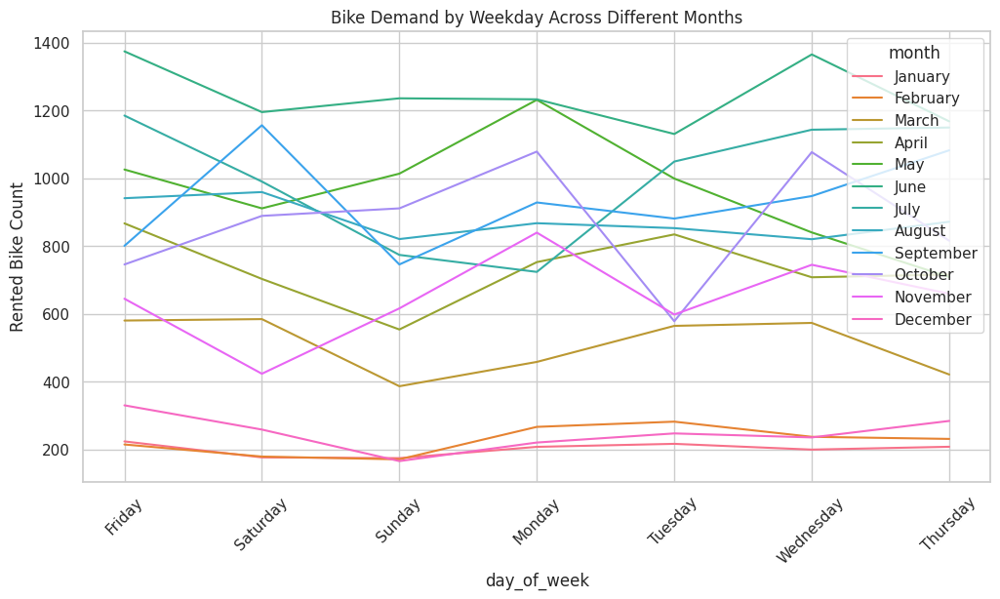

In [41]:
# 4. Bike Demand by Weekday across different Months
plt.figure(figsize=(12, 6))
sns.lineplot(x='day_of_week', y='Rented Bike Count', hue='month', data=df, ci=None,
             hue_order=["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"])
plt.title('Bike Demand by Weekday Across Different Months')
plt.ylabel('Rented Bike Count')
plt.xticks(rotation=45)
plt.show()

In [42]:
#Demand through week days highly differs depending on the month, with winter months (Dec - Feb) showcasing lowest demand. June has a consistent high demand, while months like August and September showcase higher demand on the weekends.

<ipython-input-43-ac9ea2b9768a>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y='Rented Bike Count', hue='Holiday', data=df, ci=None)


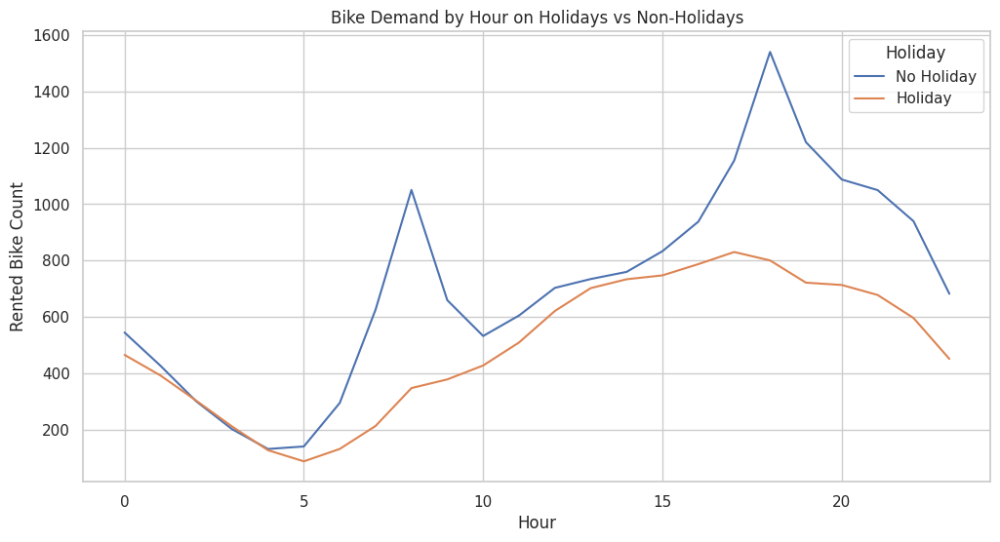

In [43]:
# 5. Bike Demand by Hour on Holidays vs Non-Holidays
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Rented Bike Count', hue='Holiday', data=df, ci=None)
plt.title('Bike Demand by Hour on Holidays vs Non-Holidays')
plt.ylabel('Rented Bike Count')
plt.show()

<ipython-input-44-7a83af5dd9b5>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Hour', y='Rented Bike Count', hue='year', data=df, ci=None, palette='Set1')


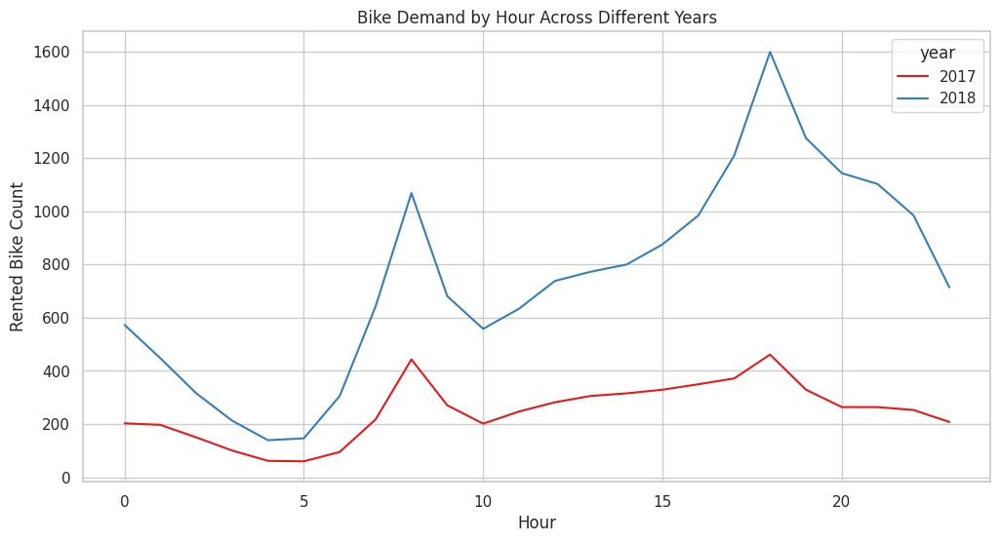

In [44]:
# 6. Bike Demand by Hour across Different Years
plt.figure(figsize=(12, 6))
sns.lineplot(x='Hour', y='Rented Bike Count', hue='year', data=df, ci=None, palette='Set1')
plt.title('Bike Demand by Hour Across Different Years')
plt.ylabel('Rented Bike Count')
plt.show()

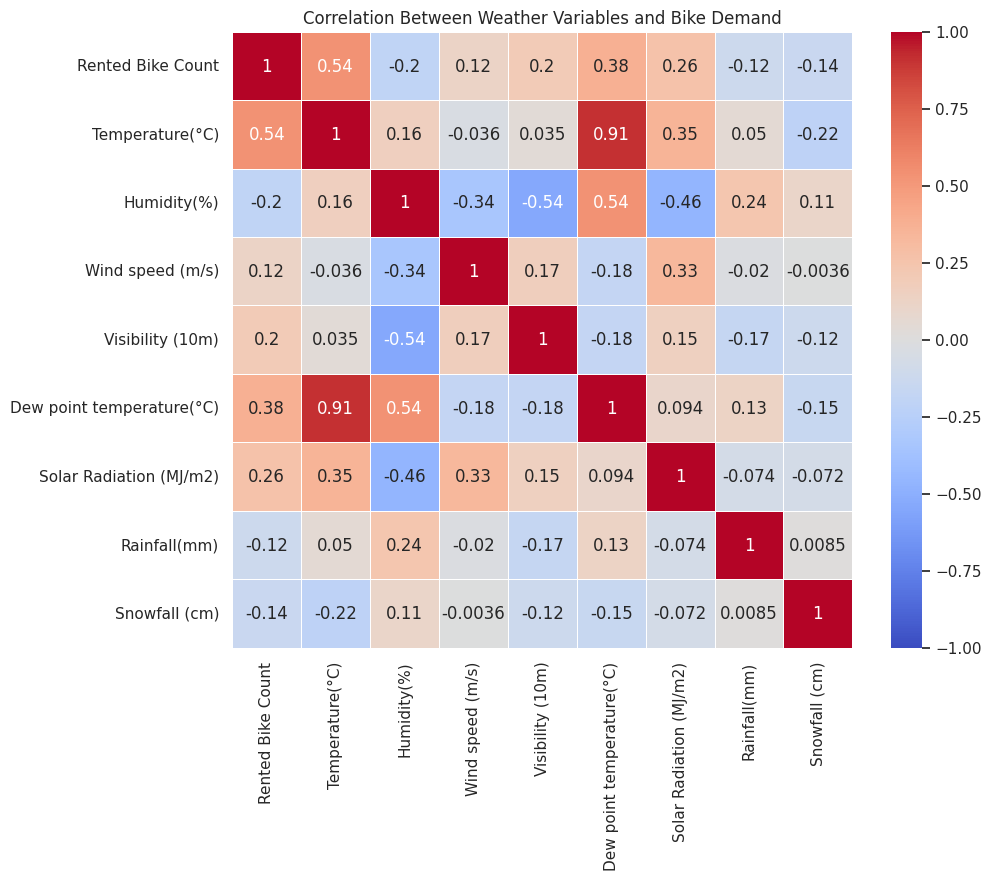

In [45]:
# Correlation

#Correlation matrix for Weather Variables

numeric_cols = ['Rented Bike Count', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
                'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)',
                'Rainfall(mm)', 'Snowfall (cm)']

corr_matrix = df[numeric_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Between Weather Variables and Bike Demand')
plt.show()

In [46]:
#Posiitve Correlation: Temperature and Dew Point (high), Ride Coutn and Temperature (moderate), Humidity and Dew Point (moderate), Temperature and Wind with Solar Radiation (moderate), Bike Count and Dew Point (moderate)
#Negative Correlation: Humidity and Visibility, Humidity and Radiation, Humidity ad Wind Speed
#Zero Correlation: Wind Speed and Snowfall, Radiation and Snowfall, Rainfall and Snowfall, Radiation and Rainfall, etc.

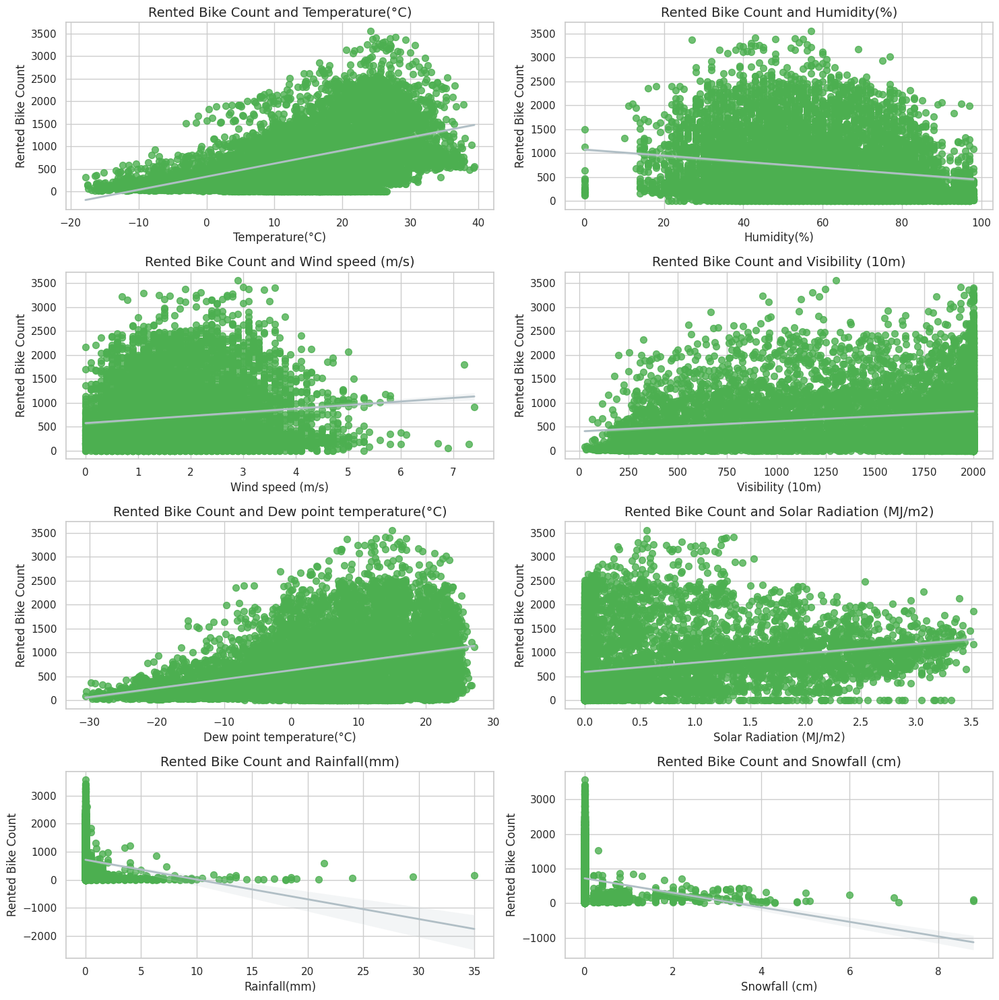

In [47]:
# Regression Plot for Weather Variables
numeric_features = df[['Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
                       'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]

n = 1
plt.figure(figsize=(15, 15))
for i in numeric_features.columns:
    if i == 'Rented Bike Count':
        pass
    else:
        plt.subplot(4, 2, n)
        n += 1
        # Use softer colors for the scatter and line
        sns.regplot(x=df[i], y=df['Rented Bike Count'],
                    scatter_kws={"color": "#4caf50", "s": 50},  # Soft green scatter points
                    line_kws={"color": "#b0bec5", "linewidth": 2})  # Light gray regression line
        plt.title(f'Rented Bike Count and {i}', fontsize=14)
        plt.xlabel(i, fontsize=12)
        plt.ylabel('Rented Bike Count', fontsize=12)
        plt.grid(True)
        plt.tight_layout()

plt.show()

In [48]:
#More Compact Presentation of the Correlations for Weather Variables
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation with Rented Bike Count
correlation_with_rented_bike_count = numeric_df.corr()['Rented Bike Count']

print(correlation_with_rented_bike_count)

Rented Bike Count            1.000000
Hour                         0.410257
Temperature(°C)              0.538558
Humidity(%)                 -0.199780
Wind speed (m/s)             0.121108
Visibility (10m)             0.199280
Dew point temperature(°C)    0.379788
Solar Radiation (MJ/m2)      0.261837
Rainfall(mm)                -0.123074
Snowfall (cm)               -0.141804
Name: Rented Bike Count, dtype: float64


In [49]:
#Temperature and hour of the day show the strongest positive correlations, implying these factors significantly impact bike rentals.
#Humidity, rainfall, and snowfall have weak negative correlations, suggesting that poor weather conditions might discourage bike rentals.

In [50]:
#In our Correlation Matrix, we also see that Temperature and Dew Point Temperature are multicollinear. We should address this before creatig a model.

from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [51]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
filtered_cols = [col for col in numeric_cols if col not in ['Rented Bike Count', 'Dew point temperature(°C)']]

In [52]:
vif_result = calc_vif(df[filtered_cols])

print("VIF Results:\n", vif_result)

df.drop(columns=['Dew point temperature(°C)'], inplace=True)

VIF Results:
                  variables       VIF
0                     Hour  3.921832
1          Temperature(°C)  3.228318
2              Humidity(%)  4.868221
3         Wind speed (m/s)  4.608625
4         Visibility (10m)  4.710170
5  Solar Radiation (MJ/m2)  2.246791
6             Rainfall(mm)  1.079158
7            Snowfall (cm)  1.120579


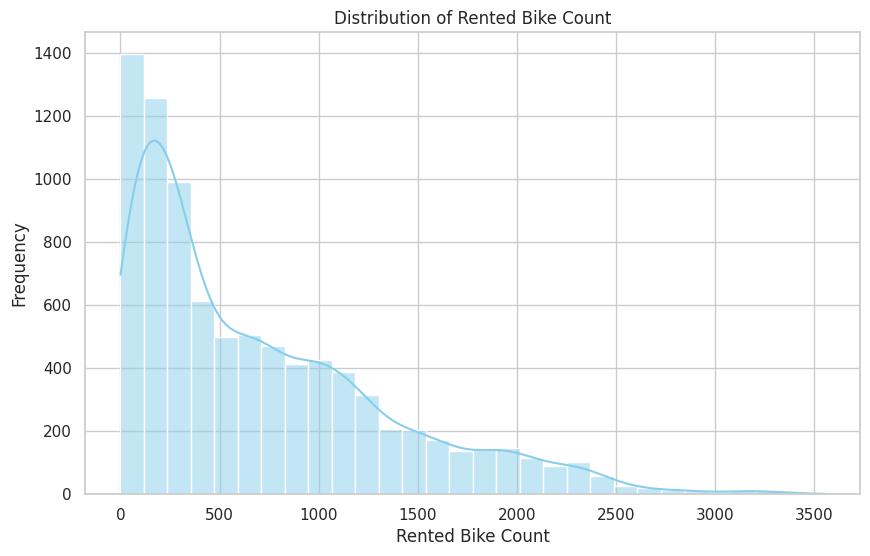

In [53]:
#Going back to our Bike Ride Count variable and normalizing it.

#To reiterate:
plt.figure(figsize=(10, 6))
sns.histplot(df['Rented Bike Count'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Rented Bike Count')
plt.xlabel('Rented Bike Count')
plt.ylabel('Frequency')
plt.show()

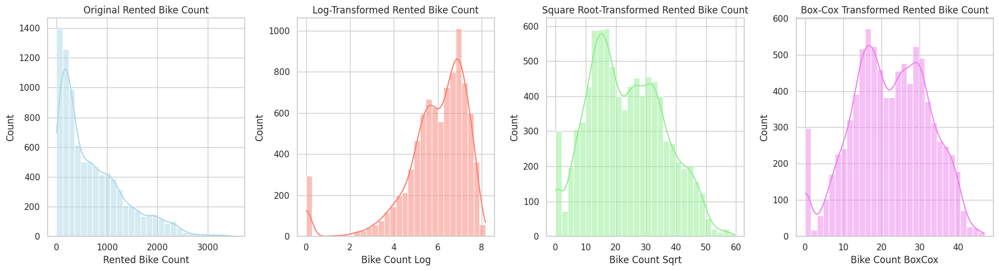

In [54]:
#Rented Bike Count is skewed on the right. We need to address this, too.
from scipy.stats import boxcox

df['Bike Count Log'] = np.log(df['Rented Bike Count'] + 1)  # Adding 1 since there are zeros in the dataset
df['Bike Count Sqrt'] = np.sqrt(df['Rented Bike Count'])
df['Bike Count BoxCox'], _ = boxcox(df['Rented Bike Count'] + 1)  # Adding 1 for zeroes

# Visualisations
plt.figure(figsize=(18, 5))

# Original distribution
plt.subplot(1, 4, 1)
sns.histplot(df['Rented Bike Count'], bins=30, kde=True, color='lightblue')
plt.title('Original Rented Bike Count')

# Log-transformed distribution
plt.subplot(1, 4, 2)
sns.histplot(df['Bike Count Log'], bins=30, kde=True, color='salmon')
plt.title('Log-Transformed Rented Bike Count')

# Square root-transformed distribution
plt.subplot(1, 4, 3)
sns.histplot(df['Bike Count Sqrt'], bins=30, kde=True, color='lightgreen')
plt.title('Square Root-Transformed Rented Bike Count')

# Box-Cox-transformed distribution
plt.subplot(1, 4, 4)
sns.histplot(df['Bike Count BoxCox'], bins=30, kde=True, color='violet')
plt.title('Box-Cox Transformed Rented Bike Count')

plt.tight_layout()
plt.show()

In [55]:
#Box-Cox Transformed Rented Bike Count seems to be more normalized.
# Removing all except chosen variable from the dataset
# Drop the original and transformed columns, keeping only 'Bike Count BoxCox'
columns_to_drop = ['Rented Bike Count', 'Bike Count Log', 'Bike Count Sqrt']
df.drop(columns=columns_to_drop, inplace=True)

# Verify the remaining columns
print(df.columns)

Index(['Date', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day', 'day_of_week',
       'month', 'year', 'Bike Count BoxCox'],
      dtype='object')


In [57]:
# Checking correlation with transformed variable
# Selecting only numeric columns for correlation calculation
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation with the transformed target variable
correlation_with_transformed = numeric_df.corr()['Bike Count BoxCox']
print(correlation_with_transformed)

Hour                       0.371958
Temperature(°C)            0.519643
Humidity(%)               -0.233183
Wind speed (m/s)           0.106305
Visibility (10m)           0.201318
Solar Radiation (MJ/m2)    0.304680
Rainfall(mm)              -0.176886
Snowfall (cm)             -0.153568
Bike Count BoxCox          1.000000
Name: Bike Count BoxCox, dtype: float64


In [58]:
#We will be removing weakly correlanted features, and selecting the variables for modelling in the next steps.

# 📈 Data Modeling

In this section, we will build a predictive model to forecast bike rental demand based on the features extracted from the dataset. We'll compare different modeling approaches and evaluate their performance to determine the best model for our use case.

## Key Objectives:
- **Select Features**: Identify the most relevant features for predicting bike rentals.
- **Split the Data**: Divide the dataset into training and testing sets.
- **Train Models**: Implement various machine learning algorithms to predict bike rentals.
- **Evaluate Performance**: Assess the performance of each model using appropriate metrics.
- **Make Predictions**: Use the best-performing model to make future predictions.


In [59]:
#Feature Selection for Modeling
#Use features with moderate to strong correlations for modeling. In this case, consider including "Hour," "Temperature(°C)," "Humidity(%)," "Visibility (10m)," "Solar Radiation (MJ/m2)," "Rainfall(mm)," any several categorical values we need to one hot encode before.
#Variables "Snowfall", "Windspeed," and "year" will not be used to model the data due to their small impact.

# One-hot encoding for categorical variables
df_encoded = pd.get_dummies(df, columns=['Holiday', 'Functioning Day', 'day_of_week', 'month', 'Seasons'], drop_first=True)

# Display the first few rows of the encoded DataFrame
print(df_encoded.head())


        Date  Hour  Temperature(°C)  Humidity(%)  Wind speed (m/s)  \
0 2017-12-01     0             -5.2           37               2.2   
1 2017-12-01     1             -5.5           38               0.8   
2 2017-12-01     2             -6.0           39               1.0   
3 2017-12-01     3             -6.2           40               0.9   
4 2017-12-01     4             -6.0           36               2.3   

   Visibility (10m)  Solar Radiation (MJ/m2)  Rainfall(mm)  Snowfall (cm)  \
0              2000                      0.0           0.0            0.0   
1              2000                      0.0           0.0            0.0   
2              2000                      0.0           0.0            0.0   
3              2000                      0.0           0.0            0.0   
4              2000                      0.0           0.0            0.0   

   year  ...  month_July  month_June  month_March  month_May  month_November  \
0  2017  ...       False       False

In [60]:
from sklearn.model_selection import train_test_split

# Define the features (X) and target (y)
X = df_encoded.drop(columns=['Bike Count BoxCox', 'Wind speed (m/s)', 'Snowfall (cm)', 'Date'])  # Include all other features
y = df_encoded['Bike Count BoxCox']

# Split the dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

print(X.dtypes)  # Check data types to ensure no datetime columns are present

Hour                         int64
Temperature(°C)            float64
Humidity(%)                  int64
Visibility (10m)             int64
Solar Radiation (MJ/m2)    float64
Rainfall(mm)               float64
year                        object
Holiday_No Holiday            bool
Functioning Day_Yes           bool
day_of_week_Monday            bool
day_of_week_Saturday          bool
day_of_week_Sunday            bool
day_of_week_Thursday          bool
day_of_week_Tuesday           bool
day_of_week_Wednesday         bool
month_August                  bool
month_December                bool
month_February                bool
month_January                 bool
month_July                    bool
month_June                    bool
month_March                   bool
month_May                     bool
month_November                bool
month_October                 bool
month_September               bool
Seasons_Spring                bool
Seasons_Summer                bool
Seasons_Winter      

In [62]:
#LINEAR REGRESSION MODEL

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 30.017399163802487
R^2 Score: 0.6927259377484193


In [63]:
#The Mean Squared Error (MSE) of approximately 30.02 indicates that, on average, the squared differences between the actual and predicted bike rental counts are moderate, suggesting room for improvement in model accuracy.
#The R² score of 0.6927 means that around 69.27% of the variance in bike rental counts can be explained by the independent variables in the model, while 30.73% remains unexplained, indicating that additional factors might influence bike rentals.
#Overall, the model performs reasonably well but has opportunities for enhancement through feature engineering, hyperparameter tuning, or exploring different algorithms.

In [65]:
##So, let's first cross-validate
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Mean Squared Error from Cross-Validation:", -scores.mean())

Mean Squared Error from Cross-Validation: 39.835715990865125


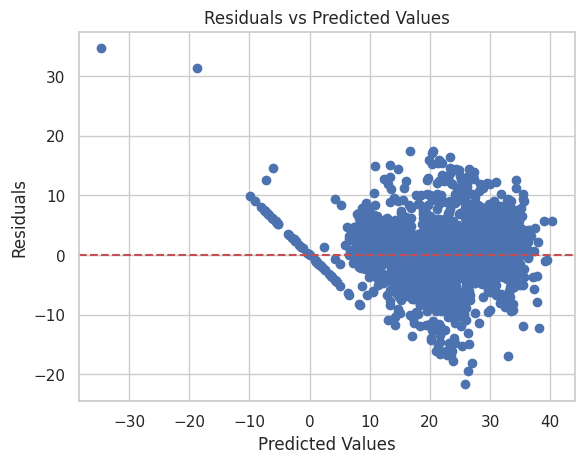

In [66]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()

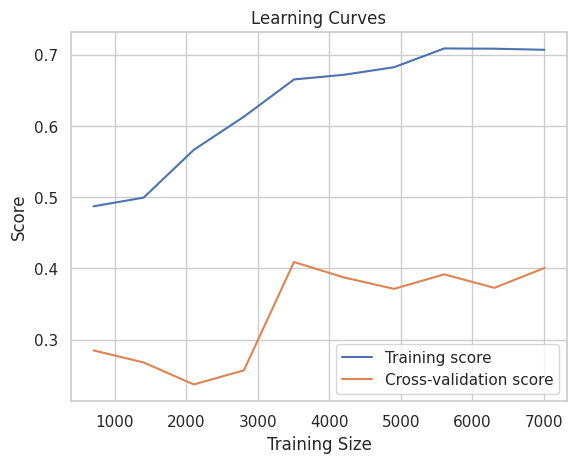

In [67]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    model, X, y, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), cv=5
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Cross-validation score')
plt.title('Learning Curves')
plt.xlabel('Training Size')
plt.ylabel('Score')
plt.legend()
plt.show()

In [68]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7008, 29), (1752, 29), (7008,), (1752,))

In [64]:
#Okay, before we look into this more, we will first check if another algorithm would perform better.

In [70]:
#XGBOOST REGRESSION MODEL

from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

X = df_encoded.drop(columns=['Bike Count BoxCox', 'Wind speed (m/s)', 'Snowfall (cm)', 'Date'])  # Include all other features
y = df_encoded['Bike Count BoxCox']

# One-hot encoding for categorical variables (if you want to convert to numeric)
X = pd.get_dummies(X, drop_first=True)

# Split into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=34)

# Define and fit the model
model = XGBRegressor(
    n_estimators=2000,
    learning_rate=0.1,
    early_stopping_rounds=50,
    n_jobs=4,
    seed=34
)

model.fit(
    X_train,
    y_train,
    eval_set=[(X_valid, y_valid)],
    verbose=False,
)

y_pred = model.predict(X_valid)

# Evaluate the model
mse = mean_squared_error(y_valid, y_pred)
r2 = r2_score(y_valid, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 4.766630085882673
R^2 Score: 0.9537684553043096


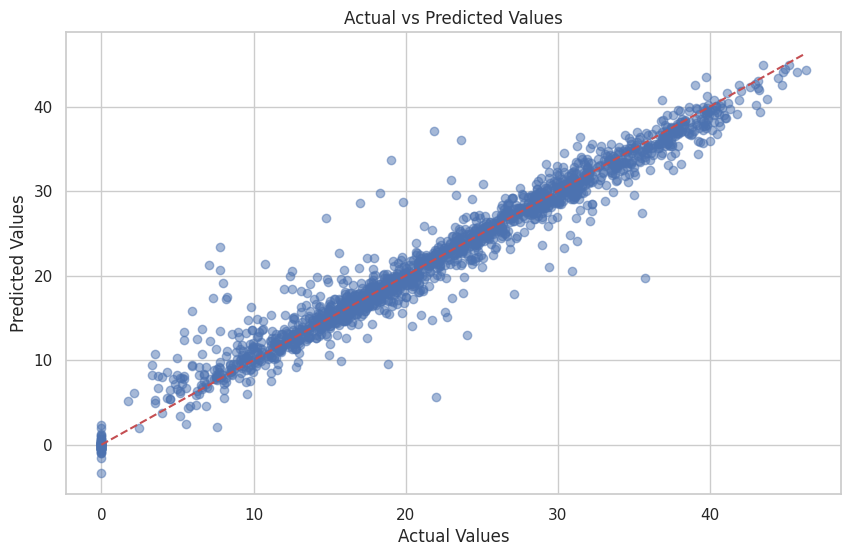

In [71]:
# Visualize Actual vs Predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_valid, y_pred, alpha=0.5)
plt.plot([y_valid.min(), y_valid.max()], [y_valid.min(), y_valid.max()], 'r--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [72]:
#The Mean Squared Error (MSE) of approximately 4.77 indicates that, on average, the squared differences between the predicted and actual values of the bike count are relatively small, suggesting a good fit to the data.
#The R² score of about 0.95 implies that 95% of the variability in the bike count can be explained by the model, indicating strong predictive power.
#Such high performance metrics demonstrate that the model captures the underlying patterns in the data effectively.
#Overall, this model has better predictive accuracy compared to simpler models.

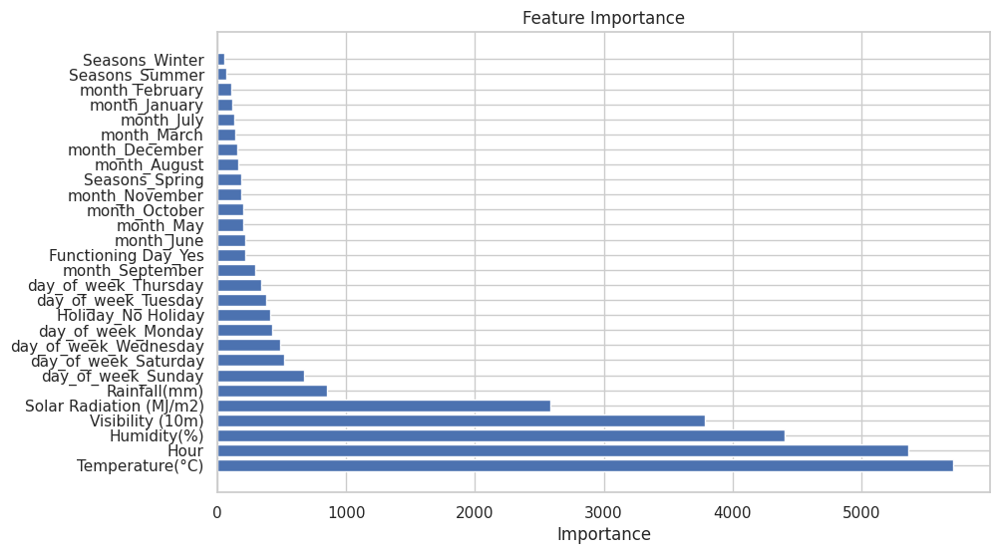

In [73]:
import xgboost as xgb

# Get feature importances
importance = model.get_booster().get_score(importance_type='weight')

# Create a DataFrame for better visualization
importance_df = pd.DataFrame(importance.items(), columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Feature Importance')
plt.show()

# 🌟 Results

To find the right model fir for forecasting the bike ride demand in Seoul with the provided dataset, we evaluated two models - Linear Regression and the XGBoost regression model. What could tell us more about their performance are the Mean Squared Error (MSE) and R² scores.

**XGBoost regression model** outperformed te Linear Regression Model significantly.
(Mean Squared Error: 4.7666
R² Score: 0.9538)


###Interpretation of Results
The Mean Squared Error of approximately 4.77 indicates that, on average, the squared differences between the predicted and actual values of the bike count are relatively small, suggesting a good fit to the data. The R² score of about 0.95 implies that 95% of the variability in the bike count can be explained by the model, indicating strong predictive power. Such high performance metrics demonstrate that the model captures the underlying patterns in the data effectively.

**XGBoost regression model** likely performed better because:
- The relationships in the dataset are complex.
- We needed a model that can handle large datasets and many features effectively.
- To improve prediction accuracy and robustness.



###Conclusion
Given the impressive performance metrics of the XGBoost model, it is evident that it outperforms simpler regression techniques, such as linear regression. XGBoost is particularly beneficial for this dataset as it can capture complex relationships and interactions between features that linear regression may miss. Additionally, it is less sensitive to outliers and can handle non-linear relationships, which contributes to its improved predictive performance, as evidenced by the high R² score and low MSE.